<a href="https://colab.research.google.com/github/Dieg0Bri/AvancesProyectoImagenes/blob/main/Tp2/ProyectoIMAGENES_locura.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from numpy.linalg import norm
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

import logging
import numpy as np
import torch
from PIL import Image
from functools import lru_cache
from functools import partial
from itertools import repeat
from multiprocessing import Pool
from os import listdir
from os.path import splitext, isfile, join
from pathlib import Path
from torch.utils.data import Dataset
from tqdm import tqdm

#DATASET IMPORT

In [2]:
import os
import tarfile
import urllib.request

# URL del archivo comprimido
url = "https://conservancy.umn.edu/bitstream/handle/11299/206575/detection.tar.gz?sequence=2&isAllowed=y"
file_name = "detection.tar.gz"

# Descargar el archivo
urllib.request.urlretrieve(url, file_name)
if not os.path.isfile(file_name):
    print("No se pudo descargar el archivo")
    exit()
# Descomprimir el archivo
with tarfile.open(file_name, "r:gz") as tar:
    print("descomprimiendo")

    tar.extractall()

descomprimiendo


In [ ]:
# Download the data and unzip it
!python tools/misc/download_dataset.py --dataset-name balloon --save-dir data --unzip

100% 36.9M/36.9M [00:01<00:00, 28.3MB/s]
Unzipping balloon_dataset.zip


In [ ]:

def load_image(filename):
    ext = splitext(filename)[1]
    if ext == '.npy':
        return Image.fromarray(np.load(filename))
    elif ext in ['.pt', '.pth']:
        return Image.fromarray(torch.load(filename).numpy())
    else:
        return Image.open(filename)

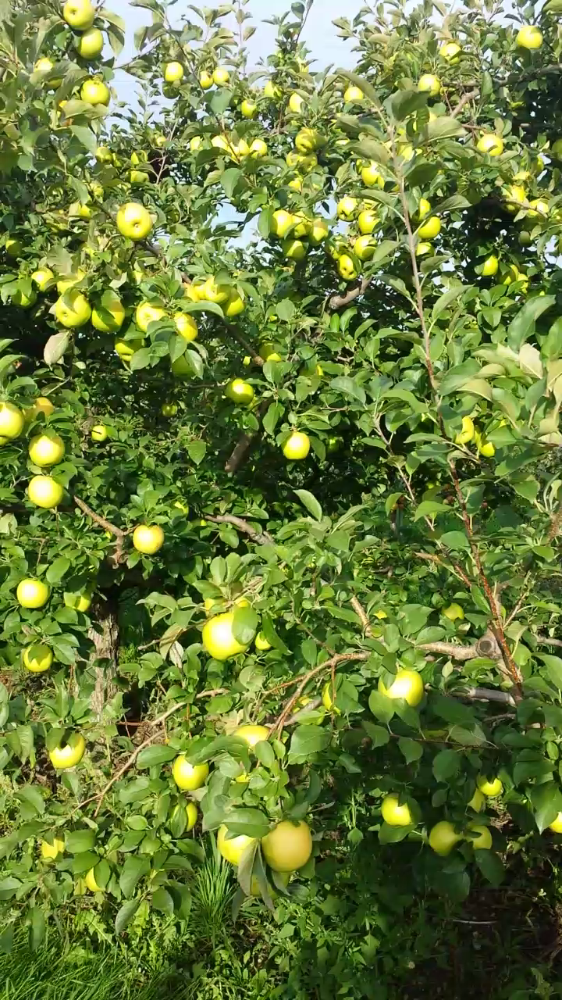

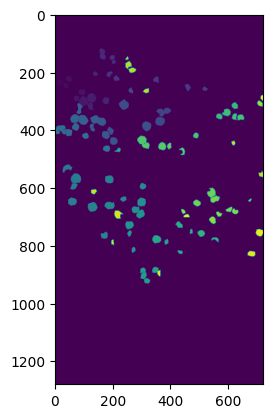

In [ ]:
img2=cv2.imread("/content/detection/train/images/20150919_174151_image301.png", cv2.IMREAD_UNCHANGED)
img = load_image("/content/detection/train/masks/20150919_174151_image11.png")

cv2_imshow(img2)
plt.imshow(img)

#CUSTOM DATASET_OBJECT

In [ ]:
import os
import numpy as np
import torch
from PIL import Image

#####################################
# Class that takes the input instance masks
# and extracts bounding boxes on the fly
#####################################
class AppleDataset(object):
    def __init__(self, root_dir, transforms):
        self.root_dir = root_dir
        self.transforms = transforms

        # Load all image and mask files, sorting them to ensure they are aligned
        self.imgs = list(sorted(os.listdir(os.path.join(root_dir, "images"))))
        self.masks = list(sorted(os.listdir(os.path.join(root_dir, "masks"))))

    def __getitem__(self, idx):
        # Load images and masks
        img_path = os.path.join(self.root_dir, "images", self.imgs[idx])
        mask_path = os.path.join(self.root_dir, "masks", self.masks[idx])

        img = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path)     # Each color of mask corresponds to a different instance with 0 being the background

        # Convert the PIL image to np array
        mask = np.array(mask)
        obj_ids = np.unique(mask)

        # Remove background id
        obj_ids = obj_ids[1:]

        # Split the color-encoded masks into a set of binary masks
        masks = mask == obj_ids[:, None, None]

        # Get bbox coordinates for each mask
        num_objs = len(obj_ids)
        boxes = []
        h, w = mask.shape
        for ii in range(num_objs):
            pos = np.where(masks[ii])
            xmin = np.min(pos[1])
            xmax = np.max(pos[1])
            ymin = np.min(pos[0])
            ymax = np.max(pos[0])

            if xmin == xmax or ymin == ymax:
                continue

            xmin = np.clip(xmin, a_min=0, a_max=w)
            xmax = np.clip(xmax, a_min=0, a_max=w)
            ymin = np.clip(ymin, a_min=0, a_max=h)
            ymax = np.clip(ymax, a_min=0, a_max=h)
            boxes.append([xmin, ymin, xmax, ymax])

        # Convert everything into a torch.Tensor
        boxes = torch.as_tensor(boxes, dtype=torch.float32)

        # There is only one class (apples)
        labels = torch.ones((num_objs,), dtype=torch.int64)
        masks = torch.as_tensor(masks, dtype=torch.uint8)

        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])

        # All instances are not crowd
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["masks"] = masks
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        return img, target

    def __len__(self):
        return len(self.imgs)

    def get_img_name(self, idx):
        return self.imgs[idx]

In [ ]:
dir = '/content/detection/train'
train_dataset= AppleDataset(root_dir = dir, transforms= None)

In [ ]:
train_dataset[0]

(<PIL.Image.Image image mode=RGB size=720x1280>,
 {'boxes': tensor([[  1., 228.,   6., 241.],
          [  5., 228.,  28., 249.],
          [ 30., 238.,  46., 256.],
          [ 37., 214.,  58., 234.],
          [ 82., 261., 104., 281.],
          [ 65., 283.,  82., 301.],
          [ 82., 284., 116., 317.],
          [111., 274., 142., 306.],
          [113., 308., 131., 331.],
          [165., 288., 187., 311.],
          [131., 198., 148., 213.],
          [154., 118., 173., 139.],
          [155., 139., 175., 156.],
          [189., 142., 206., 159.],
          [196., 159., 209., 171.],
          [178., 199., 198., 217.],
          [203., 212., 222., 230.],
          [340., 216., 359., 238.],
          [449., 242., 469., 267.],
          [510., 251., 528., 265.],
          [375., 324., 402., 344.],
          [350., 328., 378., 354.],
          [347., 357., 379., 386.],
          [254., 254., 270., 273.],
          [221., 294., 254., 331.],
          [302., 372., 332., 405.],
      

# MNIST GITHUB

In [3]:
!pip install -U openmim
!mim install mmengine
!mim install "mmcv>=2.0.0"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.7/52.7 kB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 47.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 298.9/298.9 kB 36.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 259.5/259.5 kB 35.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.8/62.8 kB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 239.4/239.4 kB 33.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.1/953.1 kB 73.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.1/77.1 kB 12.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.8/143.8 kB 19.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.7/89.7 kB 14.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.0/94.0 kB 14.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━

Looking in links: https://download.openmmlab.com/mmcv/dist/cu118/torch2.1.0/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 450.3/450.3 kB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.7/254.7 kB 34.6 MB/s eta 0:00:00
Looking in links: https://download.openmmlab.com/mmcv/dist/cu118/torch2.1.0/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.3/99.3 MB 6.3 MB/s eta 0:00:00


In [4]:
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection
!pip install -v -e .

Cloning into 'mmdetection'...
remote: Enumerating objects: 37679, done.
remote: Counting objects: 100% (280/280), done.
remote: Compressing objects: 100% (204/204), done.
remote: Total 37679 (delta 114), reused 157 (delta 72), pack-reused 37399
Receiving objects: 100% (37679/37679), 63.04 MiB | 17.62 MiB/s, done.
Resolving deltas: 100% (25953/25953), done.
/content/mmdetection
Using pip 23.1.2 from /usr/local/lib/python3.10/dist-packages/pip (python 3.10)
Obtaining file:///content/mmdetection
  Running command python setup.py egg_info
  running egg_info
  creating /tmp/pip-pip-egg-info-adq_mdh2/mmdet.egg-info
  writing manifest file '/tmp/pip-pip-egg-info-adq_mdh2/mmdet.egg-info/SOURCES.txt'
  writing manifest file '/tmp/pip-pip-egg-info-adq_mdh2/mmdet.egg-info/SOURCES.txt'
  Preparing metadata (setup.py) ... done
  Running setup.py develop for mmdet
    Running command python setup.py develop
    running develop
    /usr/local/lib/python3.10/dist-packages/setuptools/command/easy_insta

In [5]:
_base_ = [
    '../_base_/models/mask-rcnn_r50_fpn.py',
    '../_base_/datasets/coco_instance.py',
    '../_base_/schedules/schedule_1x.py', '../_base_/default_runtime.py'
]
pretrained = 'https://github.com/SwinTransformer/storage/releases/download/v1.0.0/swin_tiny_patch4_window7_224.pth'  # noqa
model = dict(
    type='MaskRCNN',
    backbone=dict(
        _delete_=True,
        type='SwinTransformer',
        embed_dims=96,
        depths=[2, 2, 6, 2],
        num_heads=[3, 6, 12, 24],
        window_size=7,
        mlp_ratio=4,
        qkv_bias=True,
        qk_scale=None,
        drop_rate=0.,
        attn_drop_rate=0.,
        drop_path_rate=0.2,
        patch_norm=True,
        out_indices=(0, 1, 2, 3),
        with_cp=False,
        convert_weights=True,
        init_cfg=dict(type='Pretrained', checkpoint=pretrained)),
    neck=dict(in_channels=[96, 192, 384, 768]))

max_epochs = 12
train_cfg = dict(max_epochs=max_epochs)

# learning rate
param_scheduler = [
    dict(
        type='LinearLR', start_factor=0.001, by_epoch=False, begin=0,
        end=1000),
    dict(
        type='MultiStepLR',
        begin=0,
        end=max_epochs,
        by_epoch=True,
        milestones=[8, 11],
        gamma=0.1)
]

# optimizer
optim_wrapper = dict(
    type='OptimWrapper',
    paramwise_cfg=dict(
        custom_keys={
            'absolute_pos_embed': dict(decay_mult=0.),
            'relative_position_bias_table': dict(decay_mult=0.),
            'norm': dict(decay_mult=0.)
        }),
    optimizer=dict(
        _delete_=True,
        type='AdamW',
        lr=0.0001,
        betas=(0.9, 0.999),
        weight_decay=0.05))

#Custom

In [ ]:
import os
import sys
import numpy as np
import torch
import torch.utils.data
from data.apple_dataset import AppleDataset

from utility.coco_utils import get_coco_api_from_dataset
from utility.coco_eval import CocoEvaluator
import utility.utils as utils
import utility.transforms as T


def get_transform(train):
    transforms = []
    transforms.append(T.ToTensor())
    if train:
        transforms.append(T.RandomHorizontalFlip(0.5))
    return T.Compose(transforms)


def read_detections(file_path):
    if not os.path.isfile(file_path):
        print("Could not read the detection file {}. No such file or directory.".format(file_path))

    detections = {}
    with open(file_path, 'r') as infile:
        for line in infile:
            im_name, x1, y1, x2, y2, score = line.rstrip().split(',')
            if im_name not in detections:
                detections[im_name] = {'boxes': np.empty((0, 4)), 'scores': np.array([float(score)]), 'labels': np.array([1])}
                detections[im_name]['boxes'] = np.vstack((detections[im_name]['boxes'], [float(x1), float(y1), float(x2), float(y2)]))
            else:
                detections[im_name]['boxes'] = np.vstack((detections[im_name]['boxes'], [float(x1), float(y1), float(x2), float(y2)]))
                detections[im_name]['scores'] = np.concatenate((detections[im_name]['scores'], [float(score)]), axis=0)
                detections[im_name]['labels'] = np.concatenate((detections[im_name]['labels'], [1]), axis=0)

        for im_name in detections:
            detections[im_name]['boxes'] = torch.from_numpy(detections[im_name]['boxes'])
            detections[im_name]['scores'] = torch.from_numpy(detections[im_name]['scores'])
            detections[im_name]['labels'] = torch.from_numpy(detections[im_name]['labels'])
        return detections


if __name__ == "__main__":
    input_dir = sys.argv[1]
    output_dir = sys.argv[2]

    submit_dir = os.path.join(input_dir, 'res')
    truth_dir = os.path.join(input_dir, 'ref')

    if not os.path.isdir(submit_dir):
        print("%s does not exist".format(submit_dir))

    if os.path.isdir(submit_dir) and os.path.isdir(truth_dir):
        if not os.path.exists(output_dir):
            os.makedirs(output_dir)

    device = torch.device('cpu')

    metric_logger = utils.MetricLogger(delimiter="  ")
    dataset = AppleDataset(os.path.join(truth_dir), get_transform(train=False))
    data_loader = torch.utils.data.DataLoader(dataset, batch_size=1,
                                              shuffle=False, num_workers=1,
                                              collate_fn=utils.collate_fn)
    # Evaluate dataset on detection
    iou_types = ['bbox']

    coco = get_coco_api_from_dataset(data_loader.dataset)
    coco_evaluator = CocoEvaluator(coco, iou_types)
    detections = read_detections(os.path.join(submit_dir, 'results.txt'))

    for image, targets in data_loader:
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        im_id = targets[0]['image_id'].item()
        im_name = data_loader.dataset.get_img_name(im_id)
        outputs = [detections[im_name]]
        outputs = [{k: v.to(device) for k, v in t.items()} for t in outputs]

        res = {target['image_id'].item(): out for target, out in zip(targets, outputs)}
        coco_evaluator.update(res)

    metric_logger.synchronize_between_processes()
    print("Averaged stats:", metric_logger)
    coco_evaluator.synchronize_between_processes()

    # accumulate predictions from all images
    coco_evaluator.accumulate()
    stats = coco_evaluator.summarize()

    outputfile_name = os.path.join(output_dir, 'scores.txt')
    output_file = open(outputfile_name, 'w')
    output_file.write("AP: {} \n".format(float(stats[0])))
    output_file.write("AP_0.5: {} \n".format(float(stats[1])))
    output_file.write("AP_0.75: {} \n".format(float(stats[2])))
    output_file.write("AP_small: {} \n".format(float(stats[3])))
    output_file.write("AP_medium: {} \n".format(float(stats[4])))
    output_file.write("AP_large: {} \n".format(float(stats[5])))
    output_file.close()

ModuleNotFoundError: ignored

#locura


In [ ]:
#!wget https://conservancy.umn.edu/bitstream/handle/11299/206575/detection.tar.gz?sequence=2&isAllowed=y

--2023-12-08 23:20:50--  https://conservancy.umn.edu/bitstream/handle/11299/206575/detection.tar.gz?sequence=2
Resolving conservancy.umn.edu (conservancy.umn.edu)... 128.101.122.105
Connecting to conservancy.umn.edu (conservancy.umn.edu)|128.101.122.105|:443... connected.
HTTP request sent, awaiting response... 200 200
Length: 1825397590 (1.7G) [application/gzip]
Saving to: ‘detection.tar.gz?sequence=2’

detection.tar.gz?se 100%[===================>]   1.70G  31.8MB/s    in 57s     

2023-12-08 23:21:47 (30.8 MB/s) - ‘detection.tar.gz?sequence=2’ saved [1825397590/1825397590]



In [ ]:
!mim download mmdet --config mask-rcnn_swin-t-p4-w7_fpn_ms-crop-3x_coco --dest ./checkpoints

processing mask-rcnn_swin-t-p4-w7_fpn_ms-crop-3x_coco...
downloading ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 182.6/182.6 MiB 24.2 MB/s eta 0:00:00
Successfully downloaded mask_rcnn_swin-t-p4-w7_fpn_ms-crop-3x_coco_20210906_131725-bacf6f7b.pth to /content/mmdetection/checkpoints
Successfully dumped mask-rcnn_swin-t-p4-w7_fpn_ms-crop-3x_coco.py to /content/mmdetection/checkpoints


In [ ]:
from pycocotools.coco import COCO

# Path to load the COCO annotation file
annotation_file = '/content/detection/train/instances_train.json'

# Initialise the COCO object
coco = COCO(annotation_file)

# Get all category tags and corresponding category IDs
categories = coco.loadCats(coco.getCatIds())
category_id_to_name = {cat['id']: cat['name'] for cat in categories}

# Print all category IDs and corresponding category names
for category_id, category_name in category_id_to_name.items():
    print(f"Category ID: {category_id}, Category Name: {category_name}")

loading annotations into memory...
Done (t=0.35s)
creating index...
index created!
Category ID: 1, Category Name: apple


In [ ]:
# prompt: check if json file is in COCO format

import json
def cargar_json(path):
    """
    Cargar un archivo JSON.

    Args:
        path (str): Ruta al archivo JSON.

    Returns:
        dict: Contenido del archivo JSON
"""
    # Cargar el contenido del archivo JSON
    with open(path, 'r') as file:
        data = json.load(file)

    return data
def is_coco_format(json_file):
    """
    Check if a JSON file is in COCO format.

    Args:
        json_file (str): Path to the JSON file.

    Returns:
        bool: True if the JSON file is in COCO format, False otherwise.
    """

    with open(json_file, 'r') as f:
        data = json.load(f)

    # Check if the JSON file contains the following keys:
    required_keys = ['images', 'categories', 'annotations']
    for key in required_keys:
        if key not in data:
            return False

    # Check if the images key is a list of dictionaries:
    if not isinstance(data['images'], list) or not all(isinstance(image, dict) for image in data['images']):
        return False

    # Check if the categories key is a list of dictionaries:
    if not isinstance(data['categories'], list) or not all(isinstance(category, dict) for category in data['categories']):
        return False

    # Check if the annotations key is a list of dictionaries:
    if not isinstance(data['annotations'], list) or not all(isinstance(annotation, dict) for annotation in data['annotations']):
        return False

    return True

print(is_coco_format("/content/detection/train/instances_val.json"))

True


In [ ]:
from pycocotools.coco import COCO

# Path to load the COCO annotation file
annotation_file = '/content/detection/train/instances_val.json'

# Initialise the COCO object
coco = COCO(annotation_file)

# Get all category tags and corresponding category IDs
categories = coco.loadCats(coco.getCatIds())
category_id_to_name = {cat['id']: cat['name'] for cat in categories}

# Print all category IDs and corresponding category names
for category_id, category_name in category_id_to_name.items():
    print(f"Category ID: {category_id}, Category Name: {category_name}")

loading annotations into memory...
Done (t=0.23s)
creating index...
index created!
Category ID: 1, Category Name: apple


In [ ]:
"""import os
import sys
#sys.path.append(mmdetection_dir)
import time
import matplotlib
import matplotlib.pylab as plt
plt.rcParams["axes.grid"] = False

# You can add more model configs like below.
MODELS_CONFIG = {
    'mask_rcnn_swin-t': {
        'config_file': '/content/mmdetection/configs/swin/mask-rcnn_swin-t-p4-w7_fpn_ms-crop-3x_coco.py'
    },
    'mask_rcnn_swin-t-w': {
        'config_file': '/content/mmdetection/configs/swin/mask-rcnn_swin-s-p4-w7_fpn_amp-ms-crop-3x_coco.py',
    }
}"""

'import os\nimport sys\n#sys.path.append(mmdetection_dir)\nimport time\nimport matplotlib\nimport matplotlib.pylab as plt\nplt.rcParams["axes.grid"] = False\n\n# You can add more model configs like below.\nMODELS_CONFIG = {\n    \'mask_rcnn_swin-t\': {\n        \'config_file\': \'/content/mmdetection/configs/swin/mask-rcnn_swin-t-p4-w7_fpn_ms-crop-3x_coco.py\'\n    },\n    \'mask_rcnn_swin-t-w\': {\n        \'config_file\': \'/content/mmdetection/configs/swin/mask-rcnn_swin-s-p4-w7_fpn_amp-ms-crop-3x_coco.py\',\n    }\n}'

In [7]:
from mmengine import Config
cfg = Config.fromfile('/content/mmdetection/configs/swin/config_swin2.py')

In [8]:
from mmengine.runner import set_random_seed

# Modify dataset classes and color
cfg.metainfo = {
    'classes': ('apple', ),
    'palette': [
        (220, 20, 60),
    ]
}




# Modify num classes of the model in box head and mask head
cfg.model.roi_head.bbox_head.num_classes = 1
cfg.model.roi_head.mask_head.num_classes = 1

# Set up working dir to save files and logs.
cfg.work_dir = './tutorial_exps'


# We can set the evaluation interval to reduce the evaluation times
cfg.train_cfg.val_interval = 3
# We can set the checkpoint saving interval to reduce the storage cost
cfg.default_hooks.checkpoint.interval = 3




# We can also use tensorboard to log the training process
#cfg.visualizer.vis_backends.append({"type":'TensorboardVisBackend'})

#------------------------------------------------------
config=f'/content/config_swin2.py'
with open(config, 'w') as f:
    f.write(cfg.pretty_text)

In [9]:
config=f'/content/config_swin2.py'

In [10]:
print(config)

/content/config_swin2.py


In [11]:
!python tools/train.py {config}

12/09 21:40:15 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.10.12 (main, Nov 20 2023, 15:14:05) [GCC 11.4.0]
    CUDA available: True
    numpy_random_seed: 893453595
    GPU 0: Tesla T4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 11.8, V11.8.89
    GCC: x86_64-linux-gnu-gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
    PyTorch: 2.1.0+cu118
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v3.1.1 (Git Hash 64f6bcbcbab628e96f33a62c3e975f8535a7bde4)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX512
  - CUDA Runtime 11.8
  - NVCC architecture flags: -gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_

In [ ]:
%pip install tensorboard  -i https://mirrors.ustc.edu.cn/pypi/web/simple

Looking in indexes: https://mirrors.ustc.edu.cn/pypi/web/simple


In [ ]:
# load tensorboard in jupyter notebook
%load_ext tensorboard

In [ ]:
# see curves in tensorboard
# if you see <IPython.core.display.HTML object> please run it again
%tensorboard --logdir tutorial_exps/

<IPython.core.display.Javascript object>

In [12]:
cfg = Config.fromfile('/content/mmdetection/configs/swin/config_swin2.py')

In [13]:
import mmcv
from mmdet.apis import init_detector, inference_detector
img = mmcv.imread('/content/detection/train/images/20150919_174151_image301.png',channel_order='rgb')
checkpoint_file = '/content/mmdetection/tutorial_exps/epoch_1.pth'
model = init_detector(cfg, checkpoint_file, device='cpu')
new_result = inference_detector(model, img)
print(new_result)

Loads checkpoint by local backend from path: /content/mmdetection/tutorial_exps/epoch_1.pth
<DetDataSample(

    META INFORMATION
    batch_input_shape: (1344, 768)
    img_id: 0
    img_shape: (1333, 750)
    pad_shape: (1344, 768)
    ori_shape: (1280, 720)
    img_path: None
    scale_factor: (1.0416666666666667, 1.04140625)

    DATA FIELDS
    ignored_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            bboxes: tensor([], size=(0, 4))
            labels: tensor([], dtype=torch.int64)
            masks: BitmapMasks(num_masks=0, height=1280, width=720)
        ) at 0x7ea6f02c7640>
    pred_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            scores: tensor([0.2248, 0.2067, 0.2032, 0.1633, 0.1582, 0.1578, 0.1565, 0.1502, 0.1496,
                        0.1439, 0.1433, 0.1375, 0.1359, 0.1333, 0.1299, 0.1287, 0.1222, 0.1212,
                        0.1193, 0.1190, 0.1163, 0.1

In [14]:
from mmdet.registry import VISUALIZERS
# init visualizer(run the block only once in jupyter notebook)
visualizer = VISUALIZERS.build(model.cfg.visualizer)
# the dataset_meta is loaded from the checkpoint and
# then pass to the model in init_detector
visualizer.dataset_meta = model.dataset_meta

/usr/local/lib/python3.10/dist-packages/mmengine/visualization/visualizer.py:196: UserWarning: Failed to add <class 'mmengine.visualization.vis_backend.LocalVisBackend'>, please provide the `save_dir` argument.
  warnings.warn(f'Failed to add {vis_backend.__class__}, '


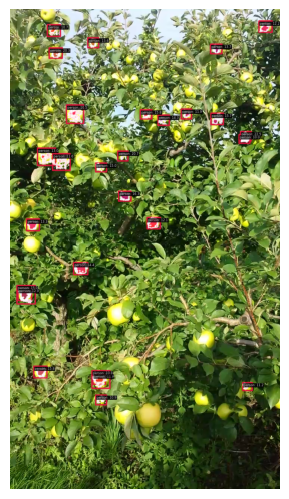

In [15]:
from mmengine.visualization import Visualizer
# get built visualizer
visualizer_now = Visualizer.get_current_instance()
# the dataset_meta is loaded from the checkpoint and
# then pass to the model in init_detector
visualizer_now.dataset_meta = model.dataset_meta
# show the results
visualizer_now.add_datasample(
    'new_result',
    img,
    data_sample=new_result,
    draw_gt=False,
    wait_time=0,
    out_file=None,
    pred_score_thr=0.1
)
visualizer_now.show()

'../_base_/datasets/coco_instance.py'